<a href="https://www.kaggle.com/code/catalystcooperative/02-state-hourly-electricity-demand?scriptVersionId=171046601" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import sys
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

print(f"Python version: {sys.version}")
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import geopandas as gpd
import sqlalchemy as sa

print(f"{np.__version__=}")
print(f"{pd.__version__=}")
print(f"{sa.__version__=}")

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in sorted(filenames):
        print(os.path.join(dirname, filename))


# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
sns.set()
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (16, 10)
matplotlib.rcParams["figure.dpi"] = 150
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 100)
pd.set_option("display.max_colwidth", 1000)

import pathlib
import sqlalchemy as sa

# Path to the directory that contains all the PUDL data on Kaggle:
pudl_path = pathlib.Path("/kaggle/input/pudl-project")

# Create a connection using SQLAlchemy, we'll pass this to pandas below to read data.
pudl_engine = sa.create_engine(f"sqlite:///{pudl_path}/pudl.sqlite")
dp1_engine = sa.create_engine(f"sqlite:///{pudl_path}/censusdp1tract.sqlite")

Python version: 3.10.13 | packaged by conda-forge | (main, Dec 23 2023, 15:36:39) [GCC 12.3.0]
np.__version__='1.26.4'
pd.__version__='2.2.1'
sa.__version__='2.0.25'
/kaggle/input/pudl-project/censusdp1tract.sqlite
/kaggle/input/pudl-project/core_epacems__hourly_emissions.parquet
/kaggle/input/pudl-project/ferc1_dbf.sqlite
/kaggle/input/pudl-project/ferc1_xbrl.sqlite
/kaggle/input/pudl-project/ferc1_xbrl_datapackage.json
/kaggle/input/pudl-project/ferc1_xbrl_taxonomy_metadata.json
/kaggle/input/pudl-project/ferc2_dbf.sqlite
/kaggle/input/pudl-project/ferc2_xbrl.sqlite
/kaggle/input/pudl-project/ferc2_xbrl_datapackage.json
/kaggle/input/pudl-project/ferc2_xbrl_taxonomy_metadata.json
/kaggle/input/pudl-project/ferc60_dbf.sqlite
/kaggle/input/pudl-project/ferc60_xbrl.sqlite
/kaggle/input/pudl-project/ferc60_xbrl_datapackage.json
/kaggle/input/pudl-project/ferc60_xbrl_taxonomy_metadata.json
/kaggle/input/pudl-project/ferc6_dbf.sqlite
/kaggle/input/pudl-project/ferc6_xbrl.sqlite
/kaggle/inp

# Read state hourly electricity demand estimates from PUDL

In [2]:
%%time
state_demand = (
    pd.read_sql("out_ferc714__hourly_estimated_state_demand", pudl_engine)
    .convert_dtypes(convert_floating=False)
)
state_demand.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6706318 entries, 0 to 6706317
Data columns (total 4 columns):
 #   Column             Dtype         
---  ------             -----         
 0   state_id_fips      string        
 1   datetime_utc       datetime64[ns]
 2   demand_mwh         float64       
 3   scaled_demand_mwh  float64       
dtypes: datetime64[ns](1), float64(2), string(1)
memory usage: 204.7 MB
CPU times: user 27.4 s, sys: 3.79 s, total: 31.2 s
Wall time: 39.6 s


# Read state geometries and IDs from Census DP1

In [3]:
%%time
sql = """
SELECT
  stusps10 as state_abbr,
  geoid10 as state_id_fips,
  name10 as state_name,
  shape as geom
FROM
  state_2010census_dp1;
"""
states = (
    gpd.read_postgis(sql, dp1_engine, crs="EPSG:4326")
    .convert_dtypes()
    .sort_values("state_abbr")
    .set_index("state_id_fips")
)

CPU times: user 59.7 ms, sys: 33.9 ms, total: 93.6 ms
Wall time: 317 ms


In [4]:
def plot_demand_timeseries(
    df: pd.DataFrame,
    window: int = None,
    title: str = None,
) -> None:
    """Make a timeseries plot of predicted and reference demand.

    Args:
        df: Predicted demand with columns `datetime_utc` and any of
            `demand_mwh` (in grey) and `scaled_demand_mwh` (in orange).
        window: Width of window (in rows) to use to compute rolling means,
            or `None` to plot raw values.
        title: Plot title.
    """
    plt.figure(figsize=(16, 8))
    # Plot predicted
    for field, color in [("demand_mwh", "red"), ("scaled_demand_mwh", "blue")]:
        y = df[field]
        if window:
            y = y.rolling(window).mean()
        plt.plot(
            df["datetime_utc"], y, color=color, alpha=0.5, label=f"{field}"
        )
    if title:
        plt.title(title)
    plt.ylabel("Hourly Electricity Demand (MW)")
    plt.legend()
    plt.show()

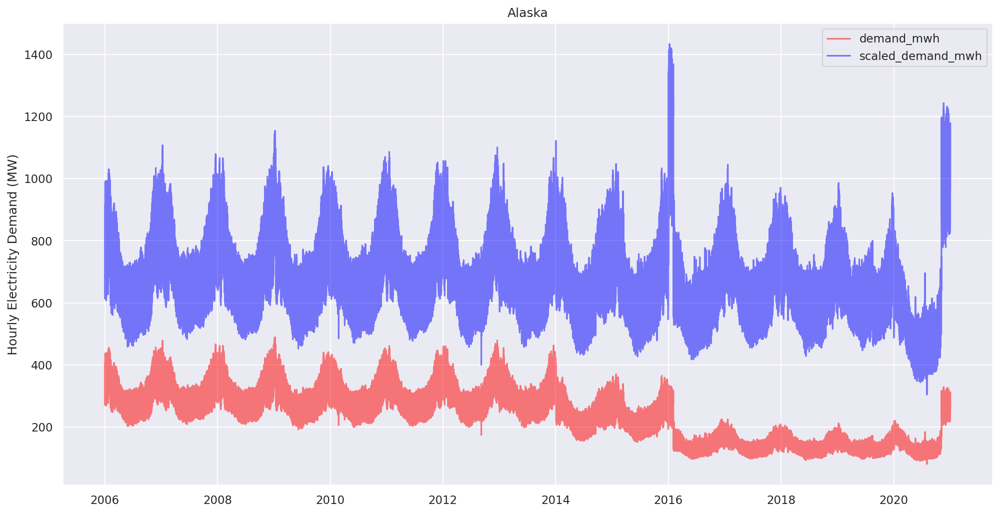

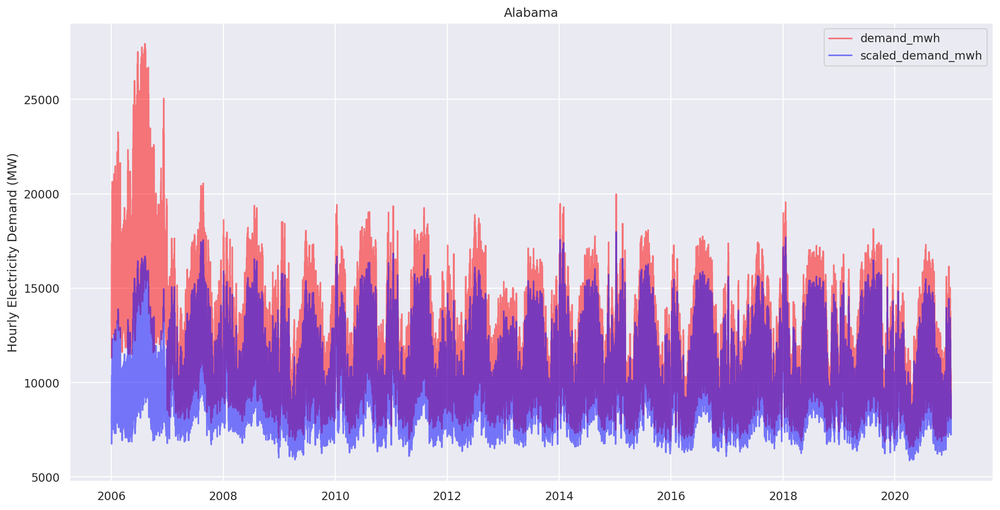

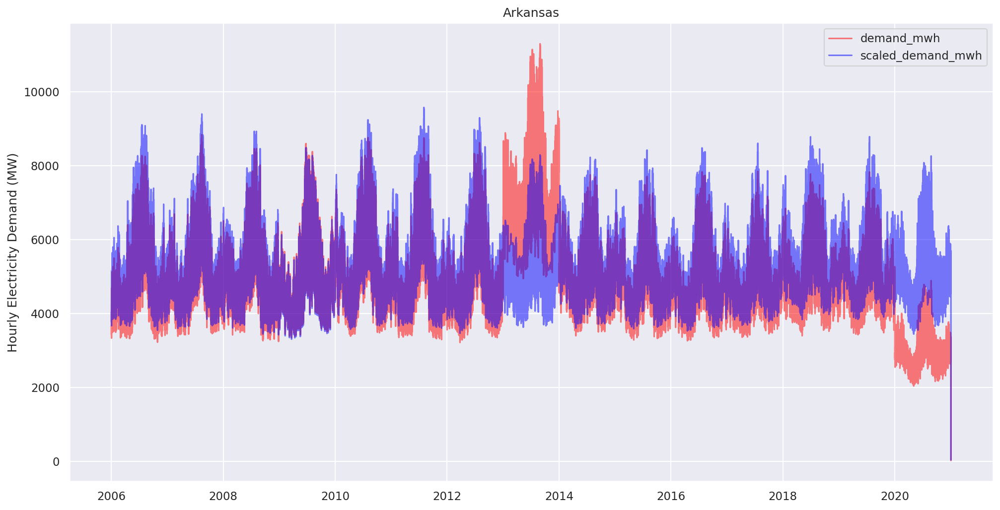

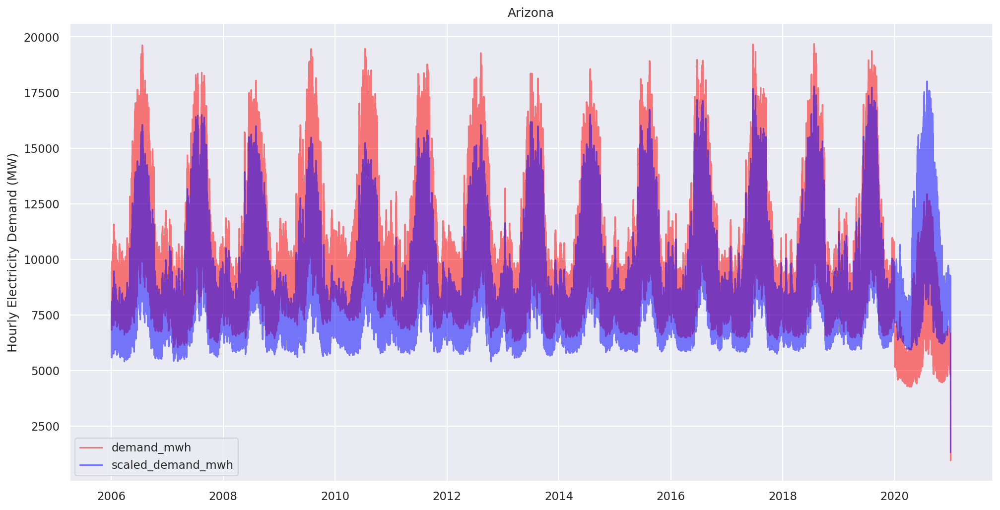

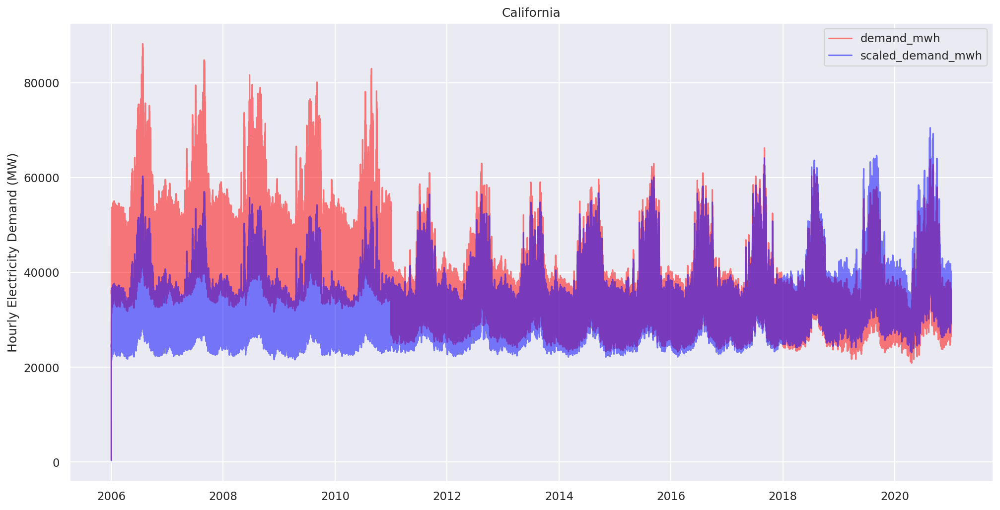

...

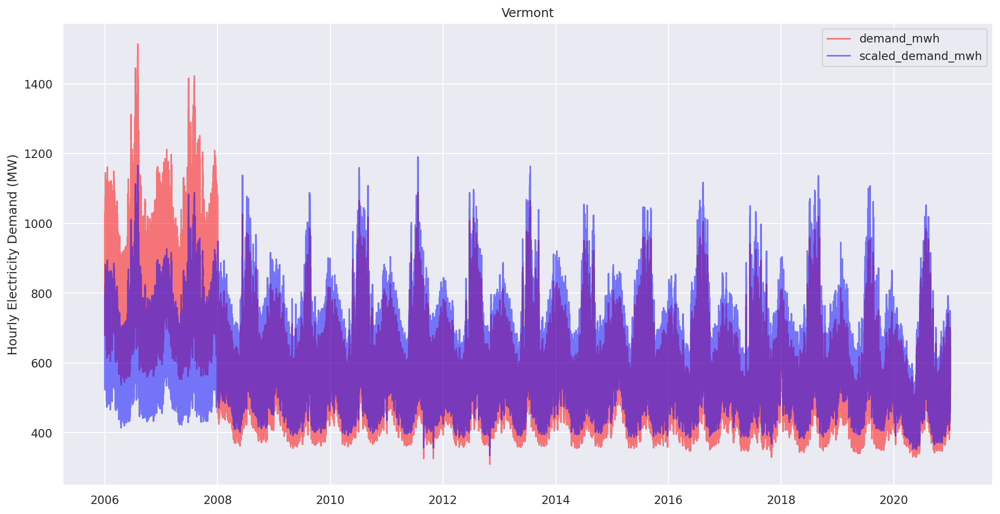

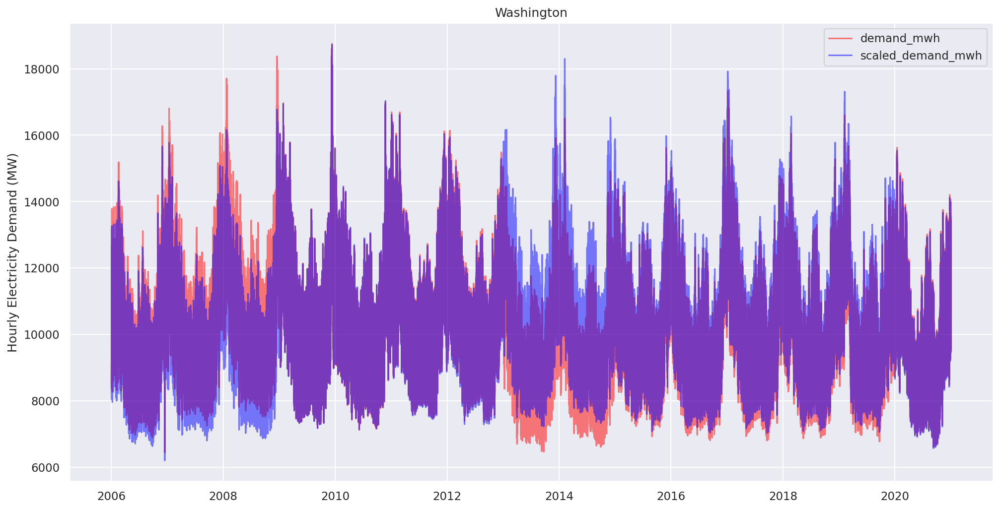

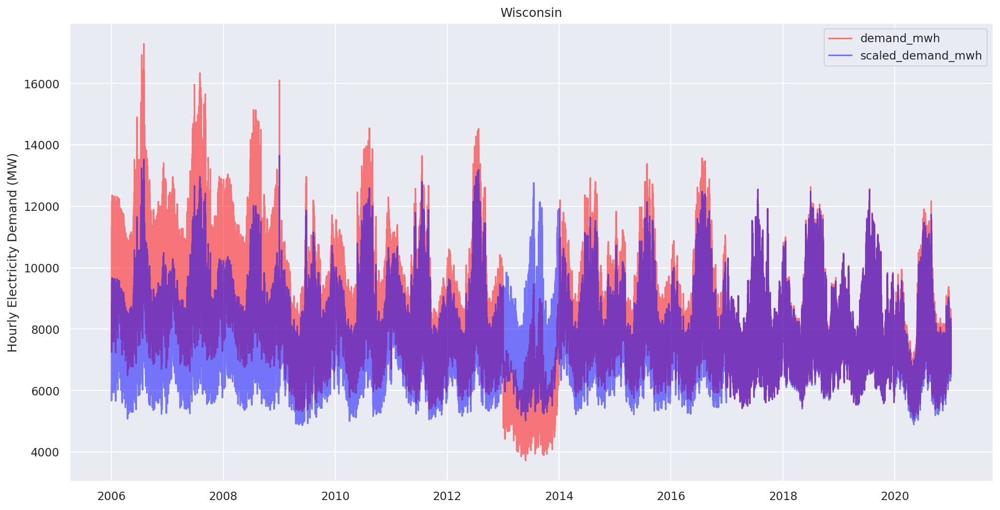

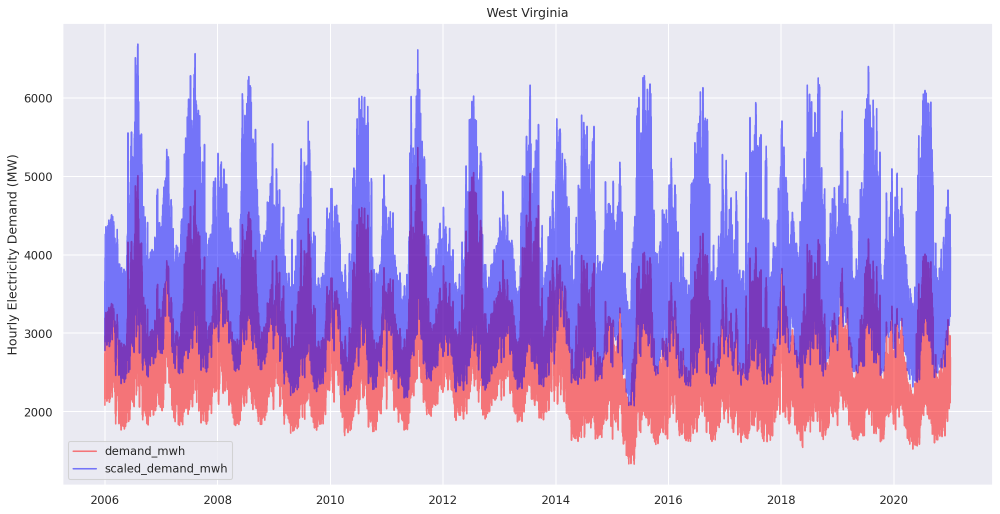

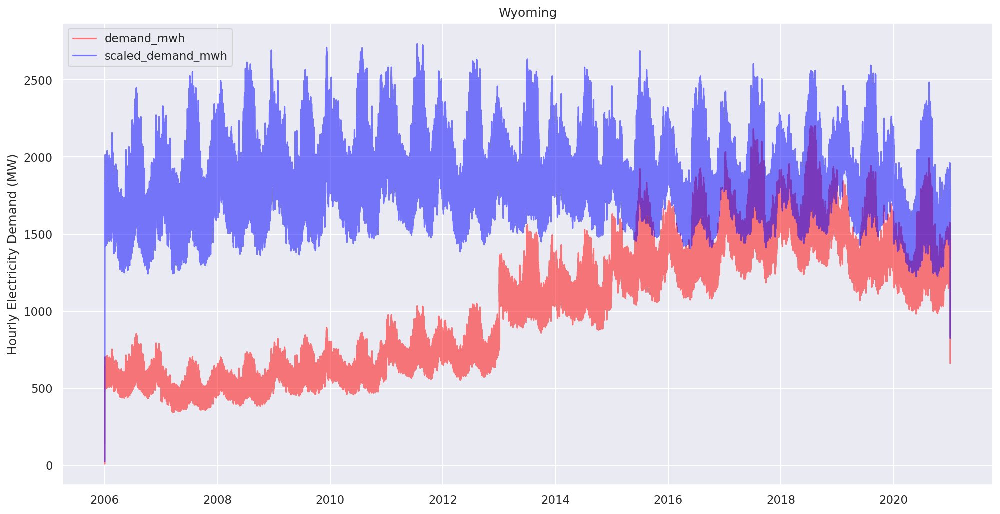

CPU times: user 2min 15s, sys: 11.7 s, total: 2min 27s
Wall time: 2min 14s


In [5]:
%%time
for state_id_fips in states.index:
    df = state_demand[state_demand.state_id_fips == state_id_fips]
    if df.empty:
        continue
    state_name = states.at[state_id_fips, "state_name"]
    title = state_name
    plot_demand_timeseries(df, title=state_name)

In [6]:
states.loc[states.state_abbr=="CA", ["state_abbr", "state_name"]]

,state_abbr,state_name
state_id_fips,,
06,CA,California


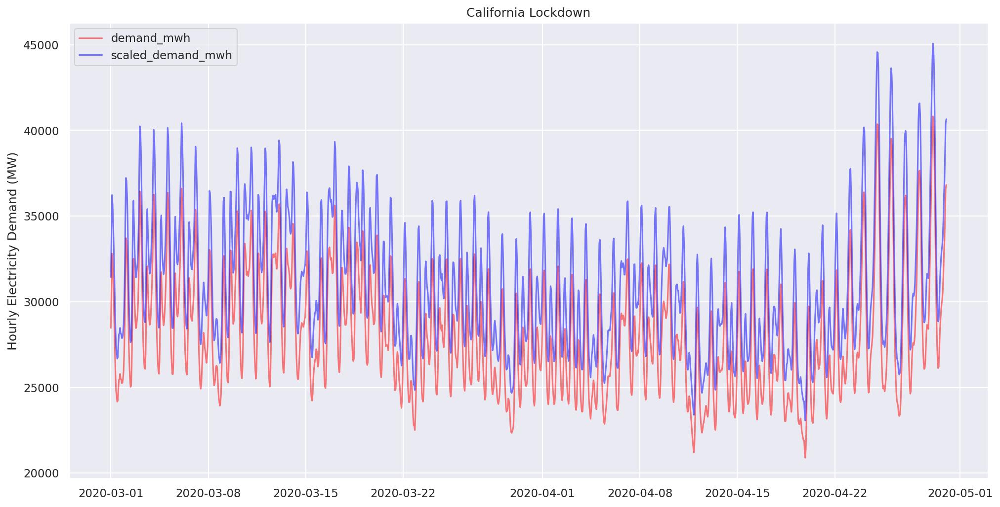

In [7]:
california_covid19 = state_demand[
    (state_demand.state_id_fips == "06") &
    (state_demand.datetime_utc >= "2020-03-01") &
    (state_demand.datetime_utc <= "2020-04-30")
]
plot_demand_timeseries(california_covid19, title="California Lockdown")